<p style="text-align:center">
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo"  />
    </a>
</p>


# **Data Visualization - Histograms**


### Student Author: Abigail Hedden

## Objectives


In this lab, you will:

- Create and analyze scatter plots to examine relationships between variables.

- Use scatter plots to identify trends and patterns in the dataset.

- Focus on visualizations centered on scatter plots for better data-driven insights.


## Set-up


In [8]:
# import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### Plotting style

In [9]:
# set plot theme
sns.set_theme(style="whitegrid")

### Load the dataset


In [2]:
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"

df = pd.read_csv(file_path)

In [3]:
df.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


In [4]:
df.columns

Index(['ResponseId', 'MainBranch', 'Age', 'Employment', 'RemoteWork', 'Check',
       'CodingActivities', 'EdLevel', 'LearnCode', 'LearnCodeOnline',
       ...
       'JobSatPoints_6', 'JobSatPoints_7', 'JobSatPoints_8', 'JobSatPoints_9',
       'JobSatPoints_10', 'JobSatPoints_11', 'SurveyLength', 'SurveyEase',
       'ConvertedCompYearly', 'JobSat'],
      dtype='object', length=114)

## Clean data for scatterplots
Some columns are not numeric and therefore proper for scatterplots. I am updating those first.

In [6]:
# update age
# map age groups to numeric values -- use midpoint of age group
age_map = {
    "Under 18 years old": 16,
    "18-24 years old": 21,
    "25-34 years old": 29.5,
    "35-44 years old": 39.5,
    "45-54 years old": 49.5,
    "55-64 years old": 59.5,
    "65 years or older": 70
}

df['AgeNumeric'] = df['Age'].map(age_map)

In [74]:
# remove ConvertedCompYearly outliers
print(df.ConvertedCompYearly.describe())
df_comp_lim = df[df['ConvertedCompYearly']<1000000]

count    2.343500e+04
mean     8.615529e+04
std      1.867570e+05
min      1.000000e+00
25%      3.271200e+04
50%      6.500000e+04
75%      1.079715e+05
max      1.625660e+07
Name: ConvertedCompYearly, dtype: float64


In [128]:
# update YearsCodePro
# update non-numerical data for less than 1 year and more than 50 years
df['YearsCodePro'] = df['YearsCodePro'].replace({'Less than 1 year': 0.5, 'More than 50 years': 51}).astype(float)
# convert to numeric
df['YearsCodePro'] = pd.to_numeric(df['YearsCodePro'], errors='coerce')

# update non-numerical data for less than 1 year and more than 50 years
df_comp_lim['YearsCodePro'] = df_comp_lim['YearsCodePro'].replace({'Less than 1 year': 0.5, 'More than 50 years': 51}).astype(float)
# convert to numeric
df_comp_lim['YearsCodePro'] = pd.to_numeric(df_comp_lim['YearsCodePro'], errors='coerce')

<ipython-input-128-ed411244befc>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp_lim['YearsCodePro'] = df_comp_lim['YearsCodePro'].replace({'Less than 1 year': 0.5, 'More than 50 years': 51}).astype(float)
<ipython-input-128-ed411244befc>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp_lim['YearsCodePro'] = pd.to_numeric(df_comp_lim['YearsCodePro'], errors='coerce')


In [93]:
df['YearsCodePro'].dtype

dtype('float64')

In [155]:
# update Employment column
# define function to create a new column that takes only the highest level of employment in each response
def categorize_employment(value):
    if pd.isna(value):
        return np.nan
    
    val = value.lower()
    
    if "full-time" in val:
        return "Employed Full-Time"
    elif "part-time" in val:
        return "Employed Part-Time"
    elif "student" in val:
        return "Student"
    elif "independent contractor" in val or "freelancer" in val or "self-employed" in val:
        return "Independent/Freelancer"
    elif "not employed, but looking" in val:
        return "Not Employed-Seeking"
    elif "not employed, and not looking" in val:
        return "Not Employed-Not Seeking"
    elif "retired" in val:
        return "Retired"
    else:
        return "Other/Mixed"
    
df["EmploymentGroup"] = df["Employment"].apply(categorize_employment)
df_comp_lim["EmploymentGroup"] = df_comp_lim["Employment"].apply(categorize_employment)


<ipython-input-155-14a12ad4354f>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comp_lim["EmploymentGroup"] = df_comp_lim["Employment"].apply(categorize_employment)


In [156]:
df_comp_lim.head(10)
df_comp_lim.groupby('EmploymentGroup')['CompTotal'].describe()

,count,mean,std,min,25%,50%,75%,max
EmploymentGroup,,,,,,,,
Employed Full-Time,20771.0,1.880033e+07,4.094239e+08,1.0,60000.0,110000.0,255000.0,3.000000e+10
Employed Part-Time,891.0,2.368432e+07,4.190338e+08,2.0,28800.0,54000.0,103000.0,1.200000e+10
Independent/Freelancer,1724.0,5.456306e+06,6.218666e+07,1.0,60000.0,120000.0,275250.0,1.500000e+09
Not Employed-Seeking,1.0,1.800000e+05,NaN,180000.0,180000.0,180000.0,180000.0,1.800000e+05
Retired,1.0,4.300000e+04,NaN,43000.0,43000.0,43000.0,43000.0,4.300000e+04


## Scatter Plots

### Scatter Plot for Age vs. Job Satisfaction



Visualize the relationship between respondents' age (`Age`) and job satisfaction (`JobSatPoints_6`). Use this plot to identify any patterns or trends.




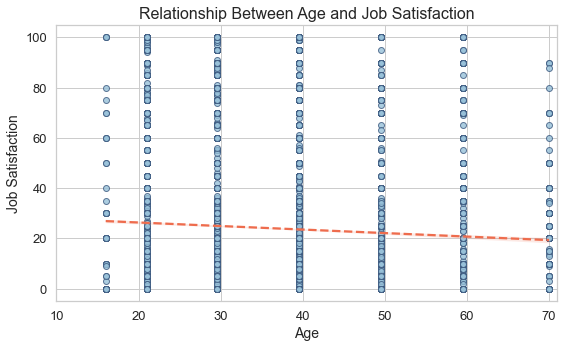

In [121]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.regplot(
    data=df,
    x="AgeNumeric",
    y="JobSatPoints_6",
    scatter=True,
    color='#98c1d9', # fill color of markers (and unless changed, the reg line)
    scatter_kws={
        'edgecolor': '#3d5a80' # set border color of scatter points
    },
    line_kws={ # customize reg line
        'linestyle': '--',
        'color': '#ee6c4d'
    }
)

ax.set_title("Relationship Between Age and Job Satisfaction", fontsize=16)
ax.set_xlabel("Age", fontsize=14)
ax.set_ylabel("Job Satisfaction", fontsize=14)
ax.tick_params(axis='both', labelsize=13)

plt.xlim(10, 71)
plt.tight_layout()
plt.show()

### Scatter Plot for Compensation vs. Job Satisfaction


Explore the relationship between yearly compensation (`ConvertedCompYearly`) and job satisfaction (`JobSatPoints_6`) using a scatter plot.


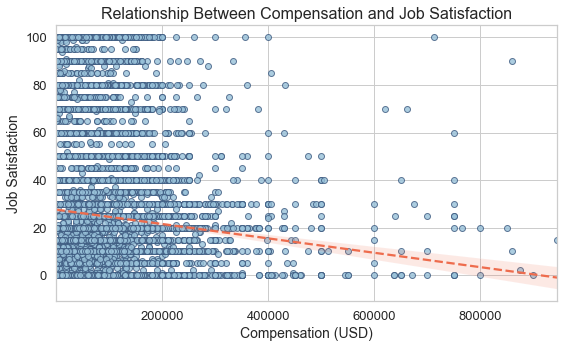

In [79]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.regplot(
    data=df_comp_lim,
    x="ConvertedCompYearly",
    y="JobSatPoints_6",
    scatter=True,
    color='#98c1d9', # fill color of markers (and unless changed, the reg line)
    scatter_kws={
        'edgecolor': '#3d5a80' # set border color of scatter points
    },
    line_kws={ # customize reg line
        'linestyle': '--',
        'color': '#ee6c4d'
    }
)

ax.set_title("Relationship Between Compensation and Job Satisfaction", fontsize=16)
ax.set_xlabel("Compensation (USD)", fontsize=14)
ax.set_ylabel("Job Satisfaction", fontsize=14)
ax.tick_params(axis='both', labelsize=13)

plt.tight_layout()
plt.show()

### Scatter Plot for Age vs. Work Experience

Visualize the relationship between Age (`Age`) and Work Experience (`YearsCodePro`) using a scatter plot.


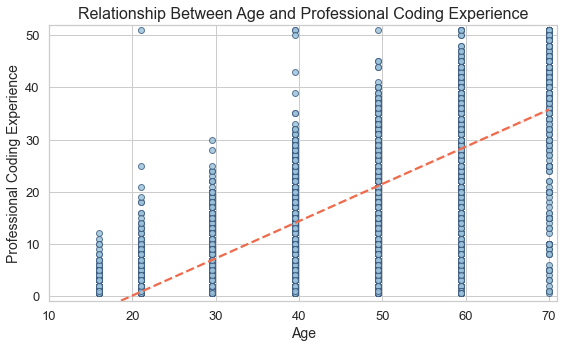

In [120]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.regplot(
    data=df,
    x="AgeNumeric",
    y="YearsCodePro",
    scatter=True,
    color='#98c1d9', # fill color of markers (and unless changed, the reg line)
    scatter_kws={
        'edgecolor': '#3d5a80' # set border color of scatter points
    },
    line_kws={ # customize reg line
        'linestyle': '--',
        'color': '#ee6c4d'
    }
)

ax.set_title("Relationship Between Age and Professional Coding Experience", fontsize=16)
ax.set_xlabel("Age", fontsize=14)
ax.set_ylabel("Professional Coding Experience", fontsize=14)
ax.tick_params(axis='both', labelsize=13)
plt.xlim(10,71)
plt.ylim(-1,52)
plt.tight_layout()
plt.show()

### Bubble Plot of Compensation vs. Job Satisfaction with Age as Bubble Size


Create a bubble plot to explore the relationship between yearly compensation (`ConvertedCompYearly`) and job satisfaction (`JobSatPoints_6`), with bubble size representing age.


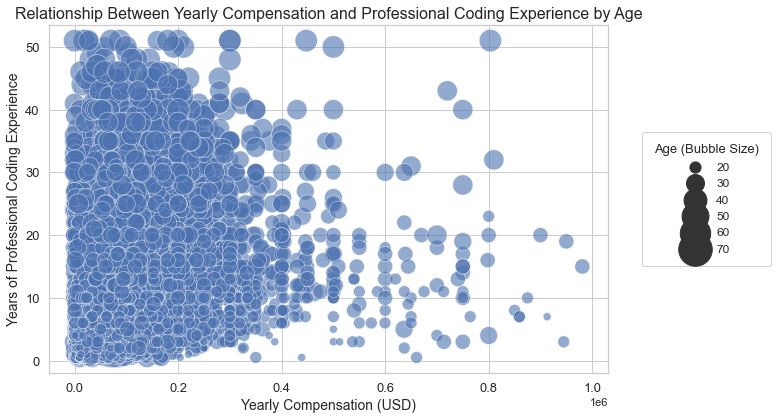

In [135]:
fig, ax = plt.subplots(figsize=(11, 6))

sns.scatterplot(
    data=df_comp_lim,
    x='ConvertedCompYearly',
    y='YearsCodePro',
    size='AgeNumeric',
    sizes=(20, 500), # adjust min and max bubble size
    alpha=0.6, # transparency of bubbles
    palette='viridis',
    legend= 'brief'
)

# customize the legend
ax.legend = ax.legend(
    title='Age (Bubble Size)',
    bbox_to_anchor=(1.05, 0.5),
    loc='center left',
    borderaxespad=0.5,
    fontsize=12,
    title_fontsize=13,
    markerscale=1.5,
    frameon=True,
    fancybox=True,
    framealpha=0.9,
    borderpad=1
)

ax.set_title("Relationship Between Yearly Compensation and Professional Coding Experience by Age", fontsize=16)
ax.set_xlabel("Yearly Compensation (USD)", fontsize=14)
ax.set_ylabel("Years of Professional Coding Experience", fontsize=14)
ax.tick_params(axis='both', labelsize=13)


plt.tight_layout()
plt.show()

### Scatter Plot for Popular Programming Languages by Job Satisfaction


Visualize the popularity of programming languages (`LanguageHaveWorkedWith`) against job satisfaction using a scatter plot. Use points to represent satisfaction levels for each language.


In [136]:
# split languages into lists
df['LanguageHaveWorkedWith'] = df['LanguageHaveWorkedWith'].str.split(';')

# explode so each language is its own row
df_exploded = df.explode('LanguageHaveWorkedWith')
df_exploded['LanguageHaveWorkedWith'] = df_exploded['LanguageHaveWorkedWith'].str.strip()

In [139]:
# calculate mean satisfaction for each language
mean_satisfaction = (df_exploded.groupby('LanguageHaveWorkedWith')['JobSatPoints_6'].mean().reset_index())

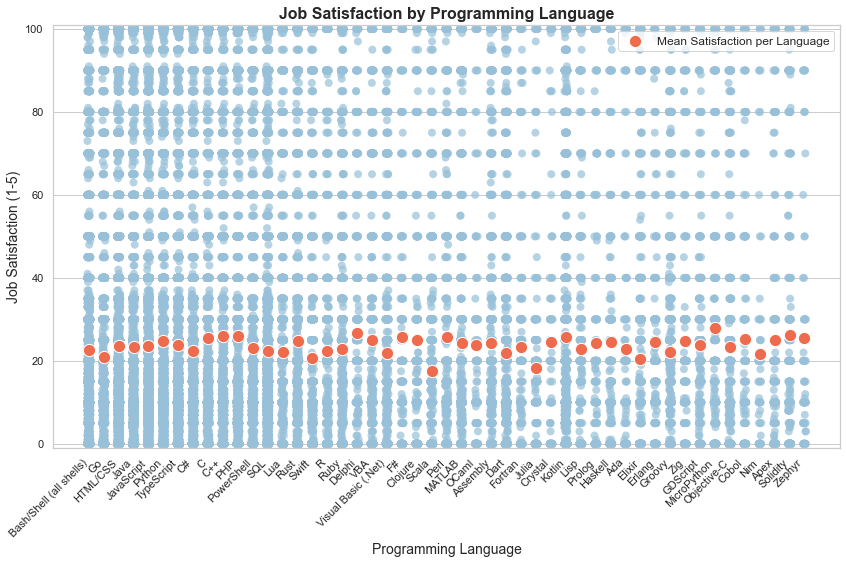

In [153]:
# set theme
plt.figure(figsize=(12, 8))

# plot all raw data
sns.stripplot(
    data=df_exploded,
    x='LanguageHaveWorkedWith',
    y='JobSatPoints_6',
    jitter=True,
    alpha=0.7,
    size=8,
    color='#98c1d9',
    zorder=1
)

# overlay mean satisfaction per language
mean_plot = sns.scatterplot(
    data=mean_satisfaction,
    x='LanguageHaveWorkedWith',
    y='JobSatPoints_6',
    color='#ee6c4d',
    s=150,
    label='Mean Satisfaction per Language',
    marker='o',
    zorder=2
)

# add legend 
plt.legend(
    loc='upper right',
    fontsize=12,
    title_fontsize=13
)

plt.title('Job Satisfaction by Programming Language', fontsize=16, weight='bold')
plt.xlabel('Programming Language', fontsize=14)
plt.ylabel('Job Satisfaction (1-5)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(-1,101)
plt.tight_layout()
plt.show()

### Scatter Plot for Compensation vs. Job Satisfaction by Employment Type


Visualize the relationship between yearly compensation (`ConvertedCompYearly`) and job satisfaction (`JobSatPoints_6`), categorized by employment type (`Employment`). Use color coding or markers to differentiate between employment types.


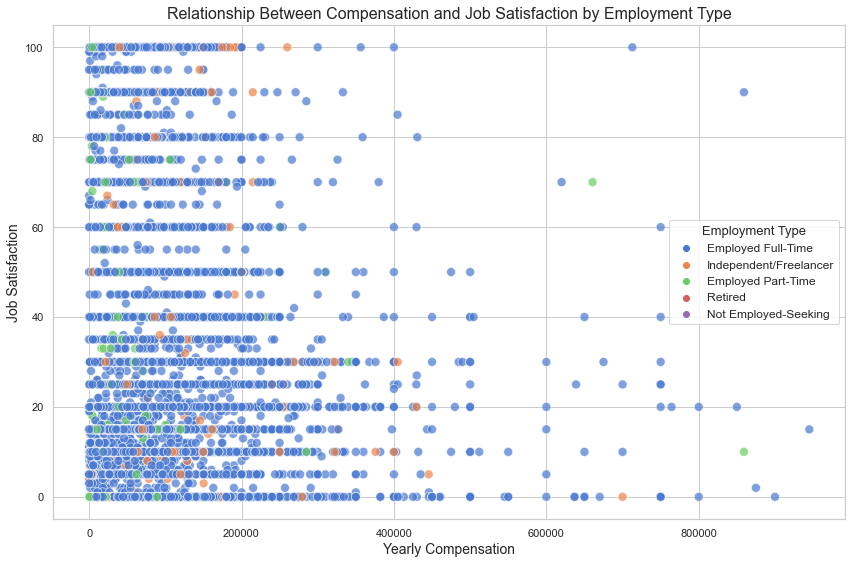

In [165]:
plt.figure(figsize=(12, 8))

sns.scatterplot(
    data=df_comp_lim,
    x='ConvertedCompYearly',
    y='JobSatPoints_6',
    hue='EmploymentGroup',
    palette='muted',
    s=80,
    alpha=0.7,
    edgecolor='w'
)

plt.title('Relationship Between Compensation and Job Satisfaction by Employment Type', fontsize=16)
plt.ylabel('Job Satisfaction', fontsize=14)
plt.xlabel('Yearly Compensation', fontsize=14)
plt.legend(title='Employment Type', fontsize=12, title_fontsize=13)
plt.tight_layout()
plt.show()

### Scatter Plot for Work Experience vs. Age Group by Country


#### I chose to plot this in numerous ways to show how to display data like this. My preferred method is the interactive plot using plotly

Compare work experience (`YearsCodePro`) across different age groups (`Age`) and countries (`Country`). Use colors to represent different countries and markers for age groups.


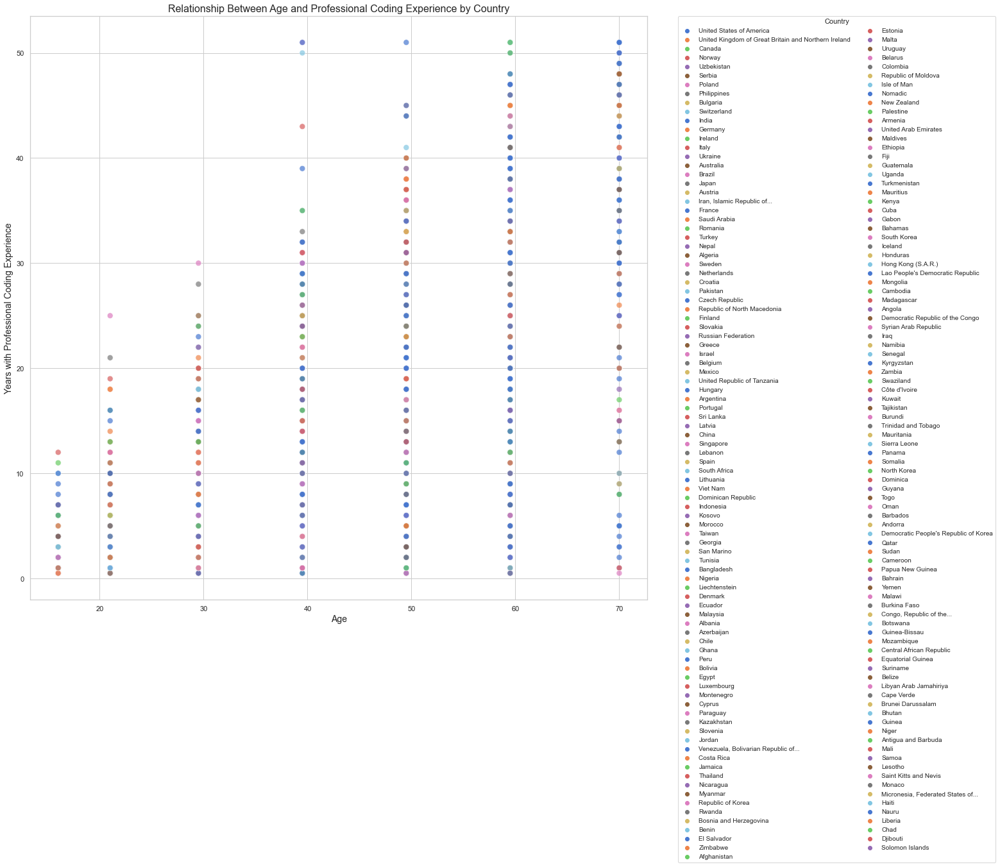

In [177]:
# most simple, but less straightforward or pleasing 
plt.figure(figsize=(22,18))

sns.scatterplot(
    data=df,
    x='AgeNumeric',
    y='YearsCodePro',
    hue='Country',
    palette='muted',
    s=80,
    alpha=0.7,
    edgecolor='w'
)

plt.legend(
    title='Country',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.,
    ncol=2,# wrap columns to 2 cols
    fontsize=10,
    title_fontsize=11
)

plt.title('Relationship Between Age and Professional Coding Experience by Country', fontsize=16)
plt.ylabel('Years with Professional Coding Experience', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.tight_layout()
plt.show()

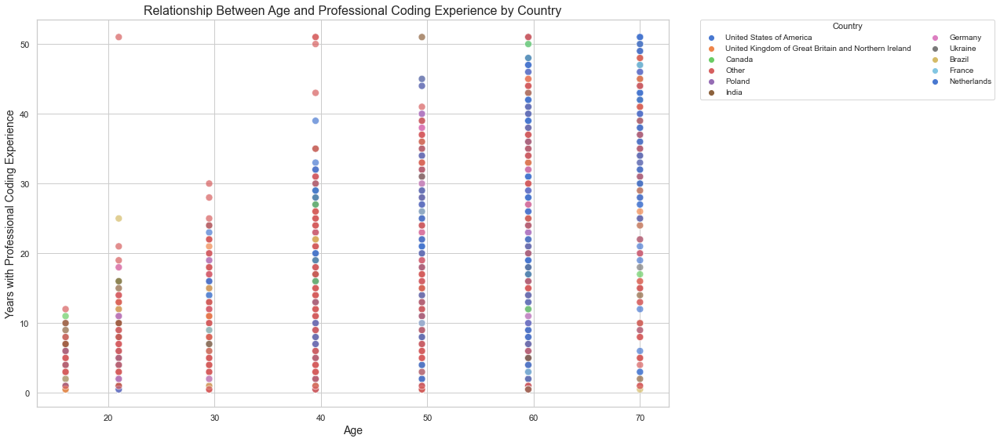

In [186]:
# only explicitly plot top 10 represented countries and plot the remaining data as "other"
# condense rare countries
top_countries = df['Country'].value_counts().nlargest(10).index
df['CountryGrouped'] = df['Country'].apply(lambda x: x if x in top_countries else 'Other')

plt.figure(figsize=(18,8))

sns.scatterplot(
    data=df,
    x='AgeNumeric',
    y='YearsCodePro',
    hue='CountryGrouped',
    palette='muted',
    s=80,
    alpha=0.7,
    edgecolor='w'
)

plt.legend(
    title='Country',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.,
    ncol=2,  
    fontsize=10,
    title_fontsize=11
)

plt.title('Relationship Between Age and Professional Coding Experience by Country', fontsize=16)
plt.ylabel('Years with Professional Coding Experience', fontsize=14)
plt.xlabel('Age', fontsize=14)
plt.tight_layout()
plt.show()

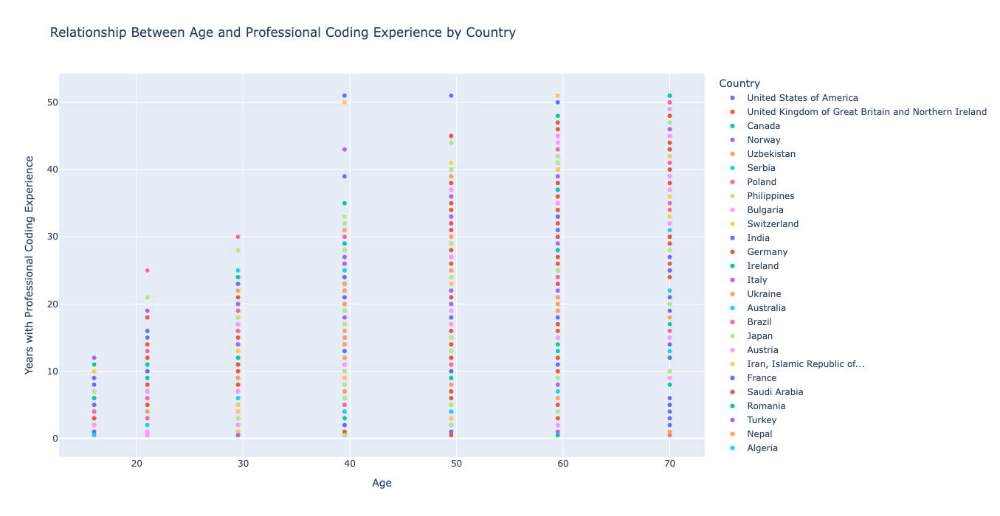

In [194]:
# make interactive plot that cleanly displays many data points and can be interacted with using plotly
fig = px.scatter(
    df,
    x='AgeNumeric',
    y='YearsCodePro',
    color='Country',
    hover_data=['Country'],
    title='Compensation vs Job Satisfaction by Country',
    log_y=False
)

fig.update_layout(
    title='Relationship Between Age and Professional Coding Experience by Country',
    xaxis_title='Age',
    yaxis_title='Years with Professional Coding Experience',
    legend_title='Country',
    height=700
)

fig.show()

## Authors:
Ayushi Jain


### Other Contributors:
- Rav Ahuja
- Lakshmi Holla
- Malika


<!--## Change Log
|Date (YYYY-MM-DD)|Version|Changed By|Change Description|
|-|-|-|-|               
|2024-10-07|1.2|Madhusudan Moole|Reviewed and updated lab|                                                                                      
|2024-10-06|1.0|Raghul Ramesh|Created lab|-->


Copyright © IBM Corporation. All rights reserved.
